# Рынок заведений общественного питания Москвы

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Предобработка-данных" data-toc-modified-id="Предобработка-данных-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Предобработка данных</a></span></li><li><span><a href="#Анализ-данных" data-toc-modified-id="Анализ-данных-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Анализ данных</a></span></li><li><span><a href="#Детализируем-исследование:-открытие-кофейни" data-toc-modified-id="Детализируем-исследование:-открытие-кофейни-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Детализируем исследование: открытие кофейни</a></span></li></ul></div>

Доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес.

Требуется подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего места для открытия заведения.

## Предобработка данных

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import folium
from folium import Map, Choropleth
from folium.plugins import MarkerCluster
from textwrap import wrap

In [2]:
sns.set_theme(style="whitegrid")
%config InlineBackend.figure_format = 'retina'

In [3]:
try:
    df = pd.read_csv('moscow_places.csv')
except:
    df=pd.read_csv('/datasets/moscow_places.csv')

In [4]:
try:
    state_geo = 'admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'

In [5]:
pd.set_option('chained_assignment', None)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Имеем таблицу с четырнадцатью столбцами. Имеются пропуски в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Восстановить пропуски не представляется возможным.

In [7]:
df.duplicated().sum()

0

Явных дубликатов нет.

Переведем названия объектов в нижний регистр, для поиска дубликатов, найдем дубликаты по названию и адресу:

In [8]:
df['name']=df['name'].str.lower()

In [9]:
df[['name', 'address']].duplicated().sum()

3

In [10]:
df.drop_duplicates(subset=['name', 'address'], keep='last', inplace=True)

Имеем три дубликата, скорее всего данные по заведениям уточнялись. Поэтому при удалении оставили последние значения.

In [11]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

Имеем девять районов, задвоений нет.

Создадим новый столбец с названием улицы:

In [12]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())
df.loc[df['street']=='МКАД', 'street'] = df.loc[df['street']=='МКАД', 'address'].apply(lambda x: x.split(',')[2].strip())

In [13]:
df.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


In [14]:
display(df['hours'].nunique())
df['hours'].unique()

1307

array(['ежедневно, 10:00–22:00',
       'пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00',
       'ежедневно, 09:00–22:00', ...,
       'пн-пт 08:30–21:30; сб,вс 09:00–21:30',
       'пн-чт 13:00–22:00; пт,сб 13:00–22:30; вс 13:00–22:00',
       'пн-сб 10:30–21:30'], dtype=object)

В столбце hours 1307 уникальных значения. Попробуем нормализовать эти значения, создадим столбец is_24/7 со следующими типами режимов работы - ежедневно круглосуточно, ежедневно не круглосуточно, круглосуточно по выходным, не ежедневно и не круглосуточно, нет данных.

In [15]:
def get_work_hours_category(row):
    if pd.isnull(row):
        return "нет данных"
    if "ежедневно" in row:
        if "круглосуточно" in row:
            return "ежедневно круглосуточно"
        else:
            return "ежедневно не круглосуточно"
    elif "круглосуточно" in row:
        return "круглосуточно по выходным"
    else:
        return "не ежедневно и не круглосуточно"

In [16]:
df['is_24/7'] = df['hours'].apply(get_work_hours_category)

In [17]:
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,ежедневно не круглосуточно
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,ежедневно не круглосуточно
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,не ежедневно и не круглосуточно
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,ежедневно не круглосуточно
4,иль марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,ежедневно не круглосуточно


Исследуем выбросы по количеству мест:

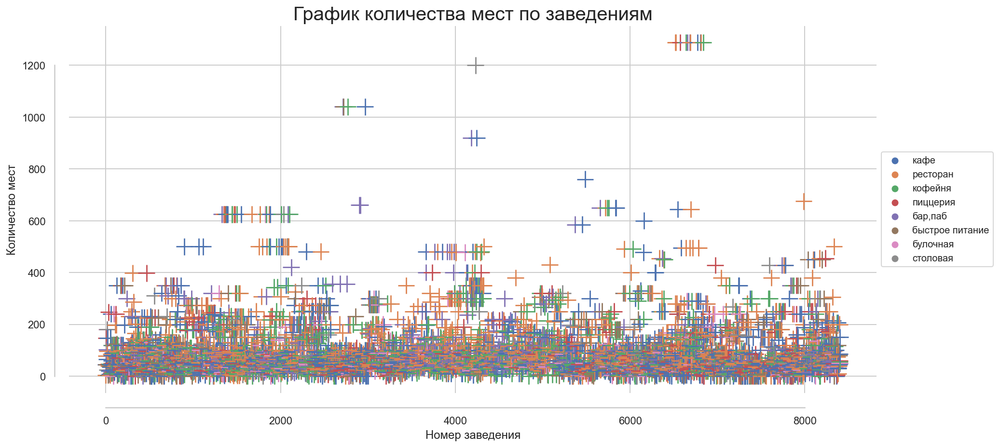

In [18]:
x_values = pd.Series(range(0,len(df['seats'])))

plt.figure(figsize=(15,7))
sns.scatterplot(x=x_values, y=df['seats'], hue=df['category'], s=300, marker="+")
plt.title('График количества мест по заведениям', fontsize=20)
plt.xlabel('Номер заведения')
plt.ylabel('Количество мест')
plt.legend(fontsize=10, loc='center left', bbox_to_anchor=(1, 0.5))
sns.despine(offset=15, trim=True)

In [19]:
print(np.percentile(df['seats'].dropna(), [95, 99]))

[307. 625.]


In [20]:
seats_border = int(np.percentile(df['seats'].dropna(), [95]))

In [21]:
df.loc[df['seats']>seats_border, 'seats'] = df.loc[df['seats']>seats_border, 'seats']/10

Всё что больше 95-го персентиля кажется аномалиями, воззможно неверно введеными данными. Эти данные перезаписали уменьшив их десятикратно.

## Анализ данных

**Категории заведений представлены в данных:**

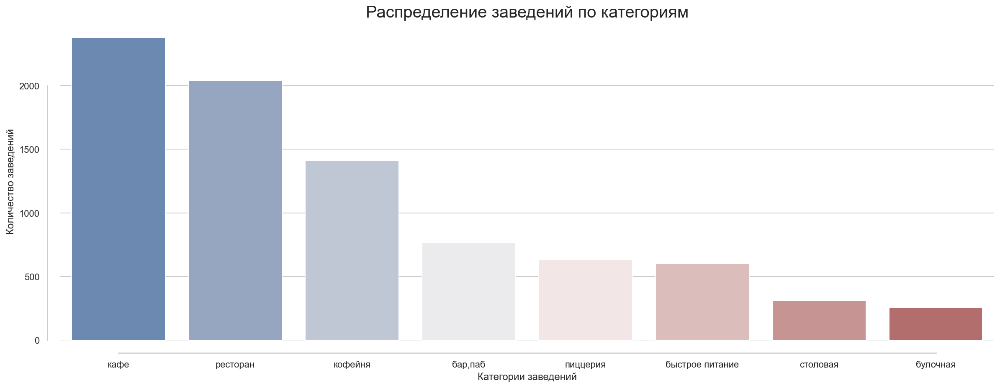

In [22]:
category = df.groupby('category').agg({'name':'count'}).reset_index().sort_values('name', ascending=False)

plt.figure(figsize=(20,7))
sns.barplot(x=category['category'], y=category['name'], palette="vlag")
plt.title('Распределение заведений по категориям', fontsize=20)
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.show()

Больше всего представлено кафе, на втором месте - рестораны, на третьем - кофейни.

**Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете:**

In [23]:
chain = df.groupby('chain').agg({'name':'count'}).reset_index().replace({0:'Несетевые', 1:'Сетевые'})

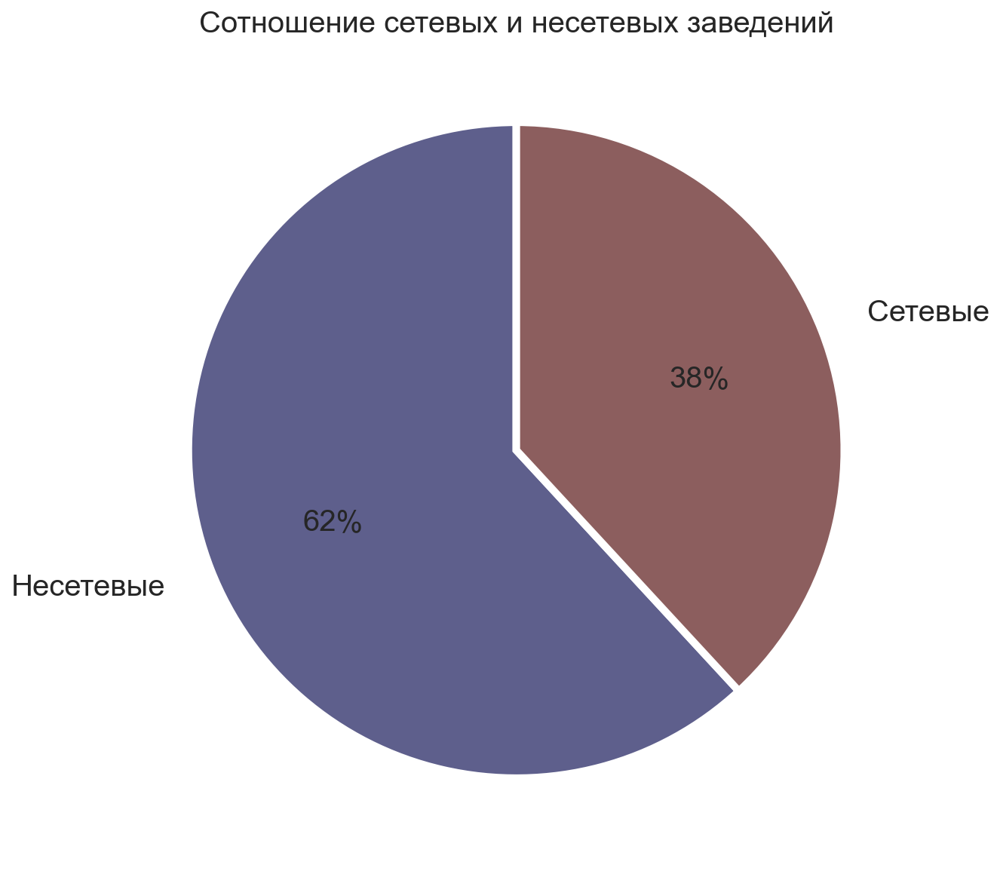

In [24]:
plt.figure(figsize=(10,10))

plt.pie(chain['name'], labels=chain['chain'], startangle=90, textprops={'fontsize': 20},
        labeldistance=1.15, wedgeprops = { 'linewidth' : 5, 'edgecolor' : 'white' }, autopct='%1.0f%%', colors=['#5e5f8c','#8c5e5e'])
plt.title('Cотношение сетевых и несетевых заведений', fontsize=20)

plt.show()

Больше половины несетевые заведения, сетевых - 38%.

**Исследуем количество посадочных мест в по категориям:**

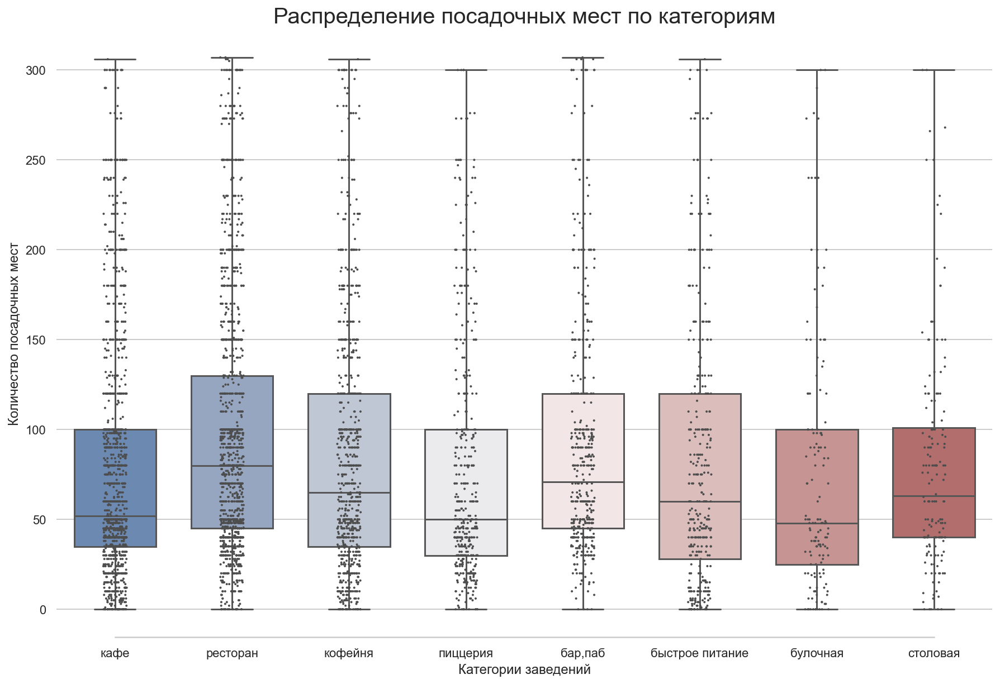

In [25]:
df['chain'] = df['chain'].replace({0:'Несетевые', 1:'Сетевые'})
# создаем фигуру, создадим логарифмическую шкалу
f, ax = plt.subplots(figsize=(15, 10))


# стоим "ящики с усами" для выбраных платформ
sns.boxplot(x="category", y="seats", data=df,
            whis=[0, 100], width=.7, palette="vlag")

# добавим точки в "ящик с усами" для наглядности
sns.stripplot(x="category", y="seats", data=df,
              size=2, color=".3", linewidth=0)


# уберем сетку, уберем надпись "платформы", выровняем ящики
ax.xaxis.grid(False)
ax.set(xlabel="")
ax.set(ylabel="Количество заведений")
sns.despine(trim=True, left=True)
plt.title('Распределение посадочных мест по категориям', fontsize=20)
plt.xlabel('Категории заведений')
plt.ylabel('Количество посадочных мест')
plt.show()

В общем стандартное количество мест у заведений около 50-60. По графику заметно, что рестораны в основном больше, чем остальные заведения. К маленьким заведениям можно отнести булочные.

**Категории заведений которые чаще являются сетевыми:**

In [26]:
chain_category = df.groupby(['chain', 'category'], as_index = False
                           ).agg({'name':'count'}
                                ).replace({0:'Несетевые', 1:'Сетевые'}).sort_values('name', ascending=False)

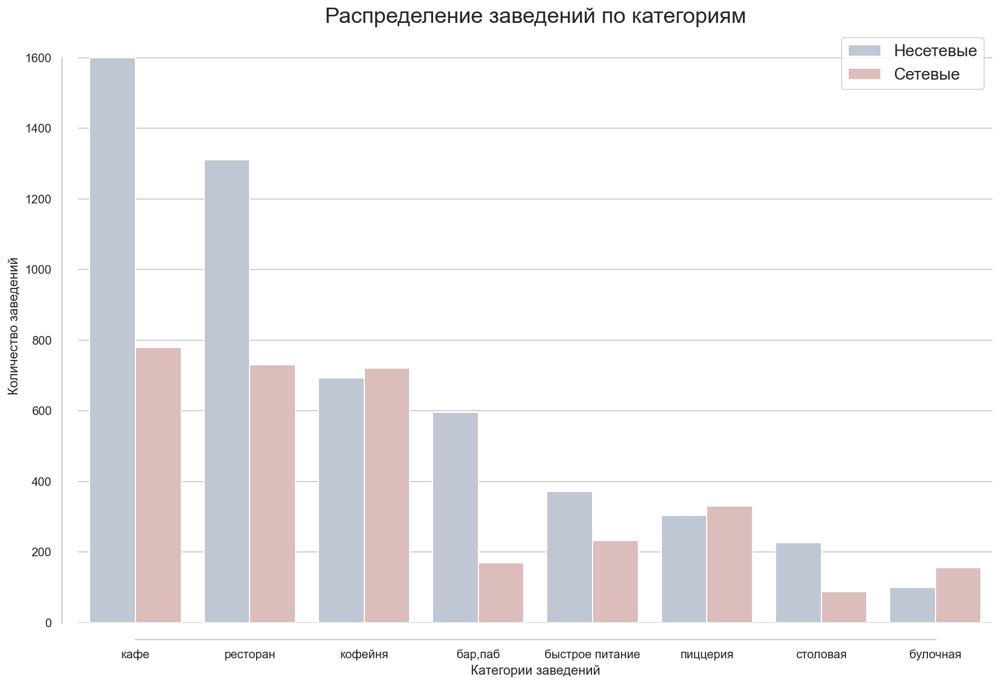

In [27]:
plt.figure(figsize=(15, 10))

sns.barplot(x='category', y='name', data=chain_category, hue='chain', palette="vlag")

sns.despine(offset=15, trim=True)
plt.title('Распределение заведений по категориям', fontsize=20)
plt.legend(fontsize=15)
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
plt.show()

Несетевых заведений значительно больше, чем сетевых в следующих категориях - бары, быстрое питание, кафе, рестораны, столовые. В категориях булочные, кофейни, пиццерии рынок удалось захватить сетевым заведениям.

**Топ-15 популярных сетей по районам:**

In [28]:
df_name = df.groupby(['name'], as_index=False
                   ).agg({'address':'count'}
                        ).sort_values('address', ascending=False
                                ).query('name not in ["кафе", "ресторан", "шаурма", "столовая", "хинкальная"]'
                                       ).head(15).merge(df.groupby(['name', 'district'], as_index=False
                                                                  ).agg({'address':'count'}),
                                                     on='name').sort_values(['address_y'],  ascending=False)
df_name.groupby('name', as_index=False
               ).agg({'address_x':'median'}
                    ).sort_values('address_x', ascending=False
                                 ).rename(columns={'address_x':'count'})

,name,count
13,шоколадница,120.0
7,домино'с пицца,77.0
6,додо пицца,74.0
3,one price coffee,72.0
14,яндекс лавка,69.0
1,cofix,65.0
4,prime,50.0
8,кофепорт,42.0
9,кулинарная лавка братьев караваевых,39.0
11,теремок,38.0


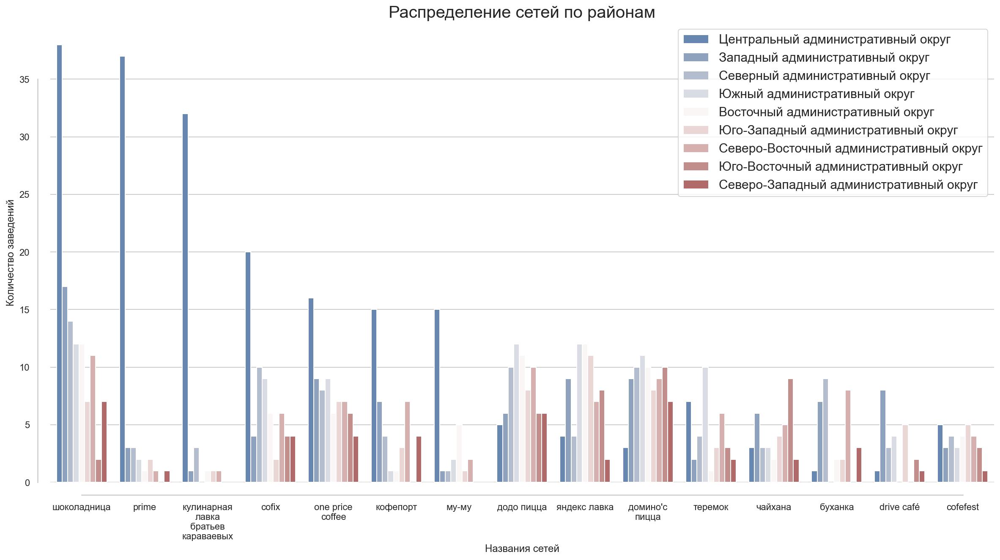

In [29]:
df_name['name'] = ['\n'.join(wrap(x, 12)) for x in  df_name['name']]

plt.figure(figsize=(20,10))
sns.barplot(data=df_name, x="name", y="address_y", hue="district", palette="vlag")
plt.title('Распределение сетей по районам', fontsize=20)
plt.xlabel('Названия сетей')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.legend(fontsize=15, loc='upper right')
plt.show()

Сети prime и кулинарная лавка братьев караваевых сфокусированы в основном на центральном округе. Такое же распределение показывают шоколадница, one price coffe, cofix, кофепорт, му-му, но эти сети присутствуют и в других районах. Сети домино'с пицца, додо пицца, янедекс лавка, буханка, drive cafe объединяет слабая представленность в центральном округе.  

**Количество заведений по районам:**

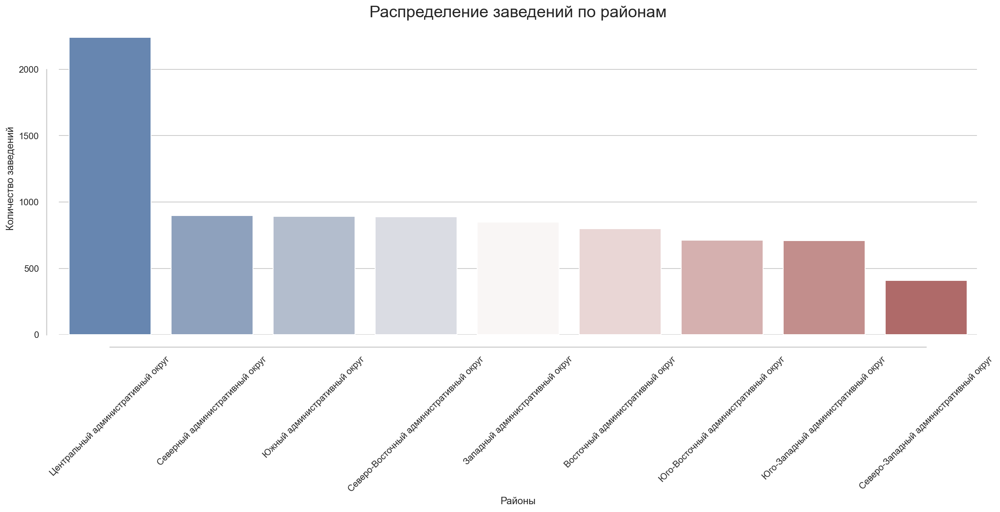

In [30]:
district = df.groupby('district').agg({'name':'count'}).reset_index().sort_values('name', ascending=False)

plt.figure(figsize=(20,7))
sns.barplot(x=district['district'], y=district['name'], palette="vlag")
plt.title('Распределение заведений по районам', fontsize=20)
plt.xlabel('Районы')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.xticks(rotation=45)
plt.show()

Больше всего заведений в центральном округе, меньше - в северо-западном, в остальных районах различия незначительные.

**Визуализируем распределение средних рейтингов по категориям заведений:**

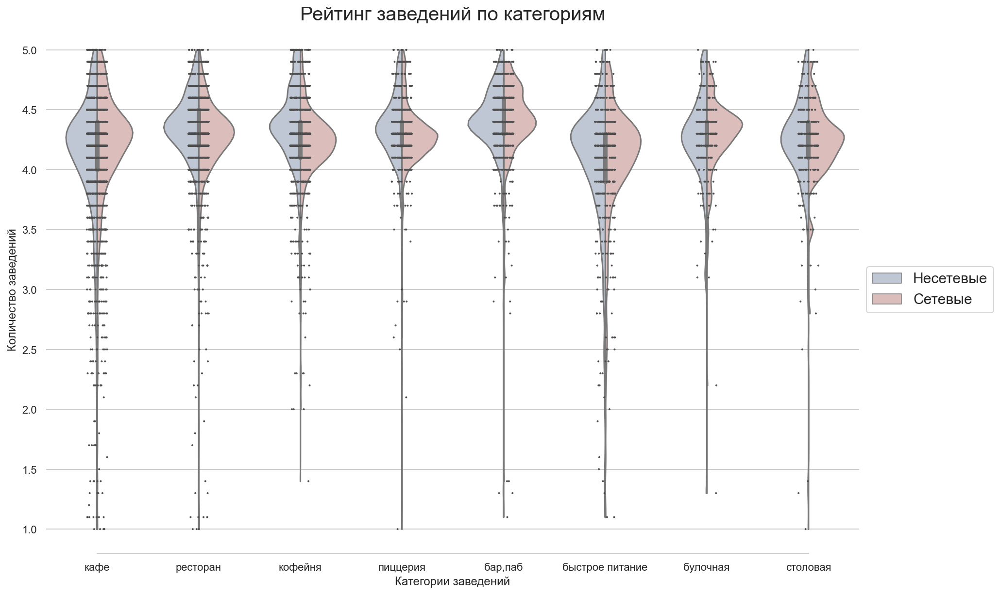

In [31]:
# создаем фигуру, создадим логарифмическую шкалу
f, ax = plt.subplots(figsize=(15, 10))


# стоим "ящики с усами" для выбраных платформ
sns.violinplot(x="category", y="rating", data=df,  hue="chain", split=True,
            whis=[0, 100], width=.7, palette="vlag", cut=0, bw=0.2)

# добавим точки в "ящик с усами" для наглядности
sns.stripplot(x="category", y="rating", data=df,
              size=2, color=".3", linewidth=0)


# уберем сетку, уберем надпись "платформы", выровняем ящики
ax.xaxis.grid(False)
ax.set(xlabel="")
ax.set(ylabel="Рейтинг")
sns.despine(trim=True, left=True)
plt.title('Рейтинг заведений по категориям', fontsize=20)
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)
plt.show()

Заметно, что более высокие оценки пользователи ставят барам. Больше всего разброс в оценках у кафе и быстрого питания. Сетевые кафейни и пиццерии имеют ниже оценки по сравнению с несетевыми. А сетевые булочные лучше несетевых.

**Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района:**

In [32]:
rating_df = df.groupby('district', as_index=False)[['rating', 'lat', 'lng']].agg('mean')
rating_df['rating'] = round(rating_df['rating'], 2)

In [33]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Stamen Toner')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# добавляем маркеры с названиями районов
for index, row in rating_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=f"{row['district']}: рейтинг - {row['rating']}").add_to(m)

# выводим карту
m

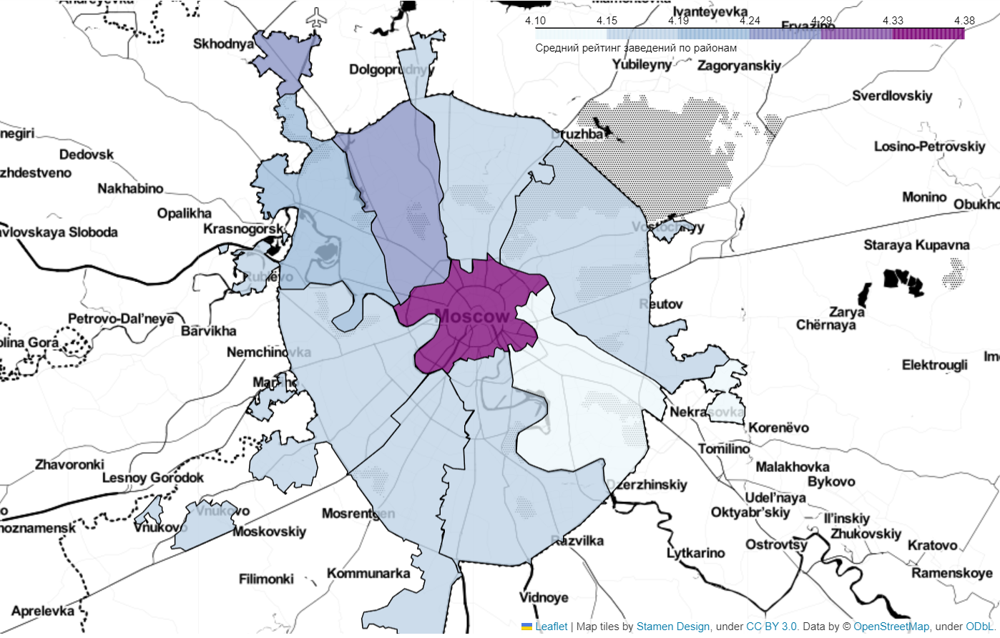

Лучшие заведения в центре.

**Проанализируем цены по округам:**

In [34]:
middle_avg_bill_df = df.groupby('district', as_index=False)[['middle_avg_bill', 'lat', 'lng']].agg('median')

In [35]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Stamen Toner')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_avg_bill_df,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Медианный чек заведений по районам',
).add_to(m)

# добавляем маркеры с названиями районов
for index, row in middle_avg_bill_df.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=f"{row['district']} - {row['middle_avg_bill']}").add_to(m)

# выводим карту
m


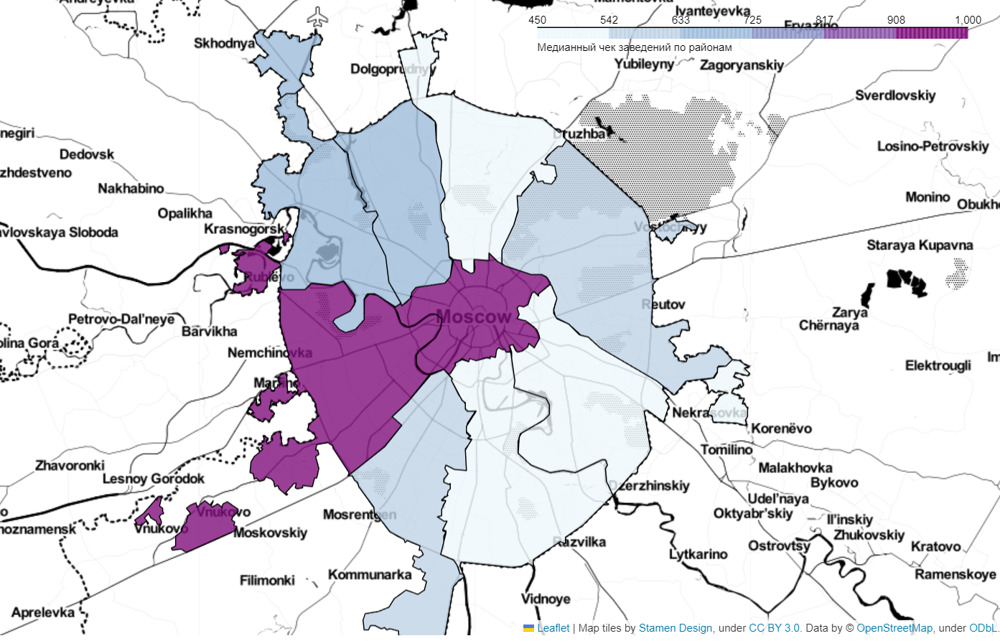

Самый высокий медианный чек в центральном и западном округах - 1000 рублей. В центральном люди платят еще за хороший сервис, как можно убедится на предыдущей карте. А западный округ просто дорогой.  

**Отобразим все заведения датасета на карте:**

In [36]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Stamen Toner')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)


# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    folium.Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

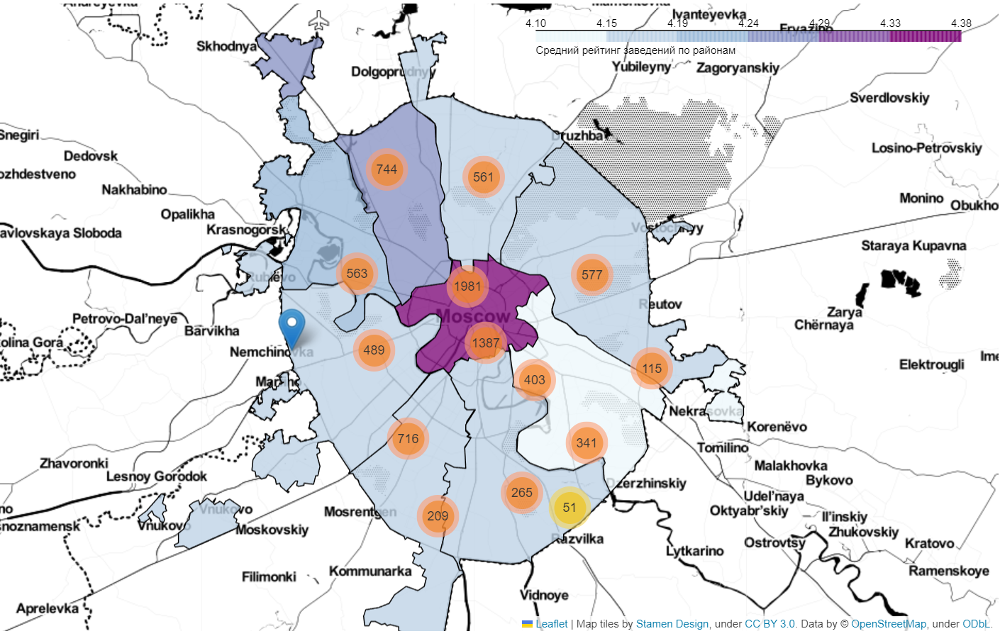

**Найдем топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.**

In [37]:
street = df.groupby(['street'], as_index=False
                   ).agg({'name':'count'}
                        ).sort_values('name', ascending=False
                                     ).head(15).merge(df.groupby(['street', 'category'], as_index=False).agg({'name':'count'}),
                                                     on='street')

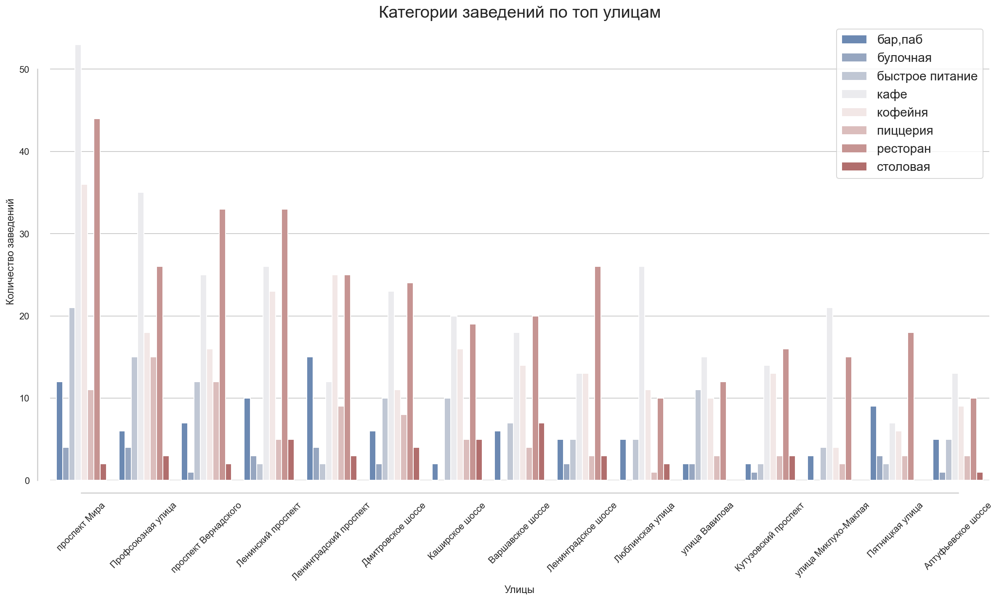

In [38]:
plt.figure(figsize=(20,10))
sns.barplot(data=street, x="street", y="name_y", hue="category", palette="vlag")
plt.title('Категории заведений по топ улицам', fontsize=20)
plt.xlabel('Улицы')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.xticks(rotation=45)
plt.legend(fontsize=15, loc='upper right')
plt.show()

Популярным улицам свойственно иметь кафе, кофейни, рестораны.Только на Пятницкой улице больше всего зяведений категории столовая.

**Найдем улицы, на которых находится только один объект общепита. Проилюстрируем категории этих заведений:**

In [39]:
singl_on_street = df[df['street'].isin(
    df.groupby('street', as_index=False).agg({'name':'count'}).query('name == 1')['street'])]

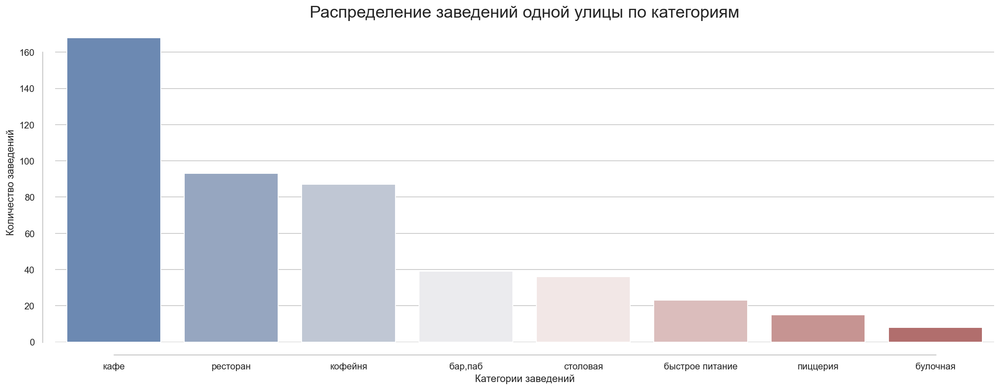

In [40]:
category_singl = singl_on_street.groupby('category').agg({'name':'count'}).reset_index().sort_values('name', ascending=False)

plt.figure(figsize=(20,7))
sns.barplot(x=category_singl['category'], y=category_singl['name'], palette="vlag")
plt.title('Распределение заведений одной улицы по категориям', fontsize=20)
plt.xlabel('Категории заведений')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.show()

Распределение похоже на общее, только можно увидеть, что отрыв кафе увеличился.

**Вывод:**


Больше всего из категорий представлено кафе, больше половины в датасете несетевые заведения. 


Самое распространенное количество мест у заведений около 50. Плохо представленны маленькие рестораны и бары. Булочные и заведения быстрого питания, несетевые кофейни обычно небольшого размера. Есть разница между сетевыми и несетевыми столовыми. Первые почти не имеют маленьких заведений.


Несетевых заведений значительно больше, чем сетевых в следующих категориях - бары, быстрое питание, кафе, рестораны, столовые. В категориях булочные, кофейни, пиццерии рынок удалось захватить сетевым заведениям.


Сети prime и кулинарная лавка братьев караваевых сфокусированы в основном на центральном округе. Такое же распределение показывают шоколадница, one price coffe, cofix, кофепорт, му-му, но эти сети присутствуют и в других районах. Сети домино'с пицца, додо пицца, янедекс лавка, буханка, drive cafe объединяет слабая представленность в центральном округе.


Больше всего заведений в центральном округе, меньше - в северо-западном, в остальных районах различия в количестве заведений незначительные.


Заметно, что более высокие оценки пользователи ставят барам. Больше всего разброс в оценках у кафе и быстрого питания. Сетевые кафейни и пиццерии имеют ниже оценки по сравнению с несетевыми. А сетевые булочные лучше несетевых.


Самый высокий медианный чек в центральном и западном округах - 1000 рублей. В центральном люди платят еще за хороший сервис, там выше средний рейтинг. 

## Детализируем исследование: открытие кофейни

In [41]:
df_cafe = df.query('category=="кофейня"')

In [42]:
print('Всего в датасете {0:} кофеен. Это {1:.1%} от общего количества заведений в датасете.'.format(len(df_cafe), len(df_cafe)/len(df)))

Всего в датасете 1413 кофеен. Это 16.8% от общего количества заведений в датасете.


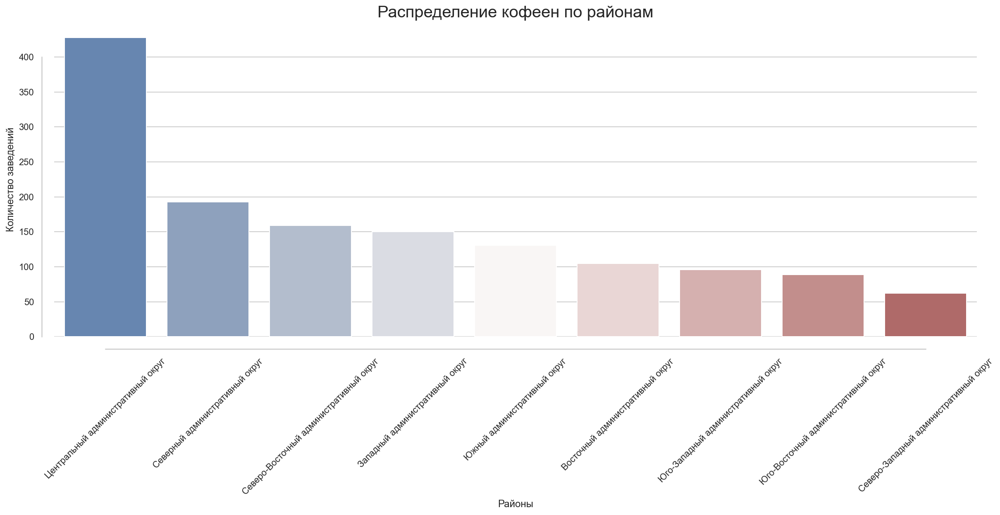

In [43]:
district_cafe = df_cafe.groupby('district', as_index=False).agg(
    {'name':'count', 
     'rating':'mean',
     'middle_coffee_cup':'median',
     'lat':'mean', 
     'lng':'mean'
    }).sort_values('name', ascending=False)

district_cafe['rating'] = round(rating_df['rating'], 2)

plt.figure(figsize=(20,7))
sns.barplot(x=district_cafe['district'], y=district_cafe['name'], palette="vlag")
plt.title('Распределение кофеен по районам', fontsize=20)
plt.xlabel('Районы')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.xticks(rotation=45)
plt.show()

Больше всего кафе в центральном округе, меньше всего в северо-западном.

**Изобразим количество заведений по районам на карте:**

In [44]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles = 'Stamen Toner')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_cafe,
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='BuPu',
    fill_opacity=0.8,
    legend_name='Количество заведений по районам',
).add_to(m)

# добавляем маркеры с названиями районов
for index, row in district_cafe.iterrows():
    folium.Marker(location=[row['lat'], row['lng']], popup=f"{row['district']}: рейтинг - {row['rating']}, чашка кофе -  {row['middle_coffee_cup']}").add_to(m)

# выводим карту
m

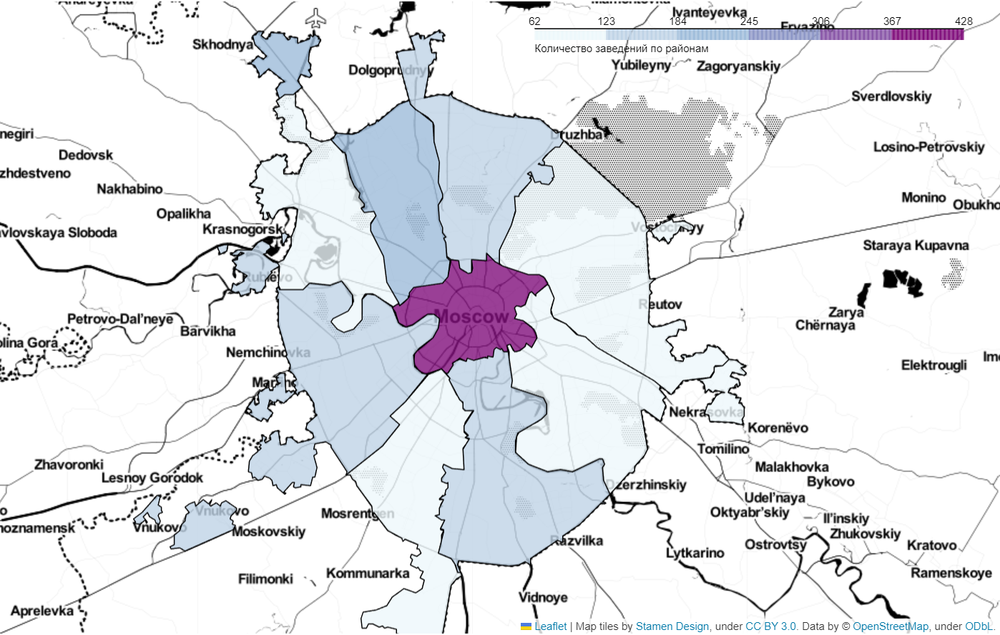

**Исследуем время работы кафеен**

In [45]:
time_cafe = df_cafe.groupby('is_24/7', as_index=False).agg(
    {'name':'count', 
     'rating':'mean',
     'middle_coffee_cup':'median'
    }).sort_values('name', ascending=False)

time_cafe['rating'] = round(time_cafe['rating'], 2)

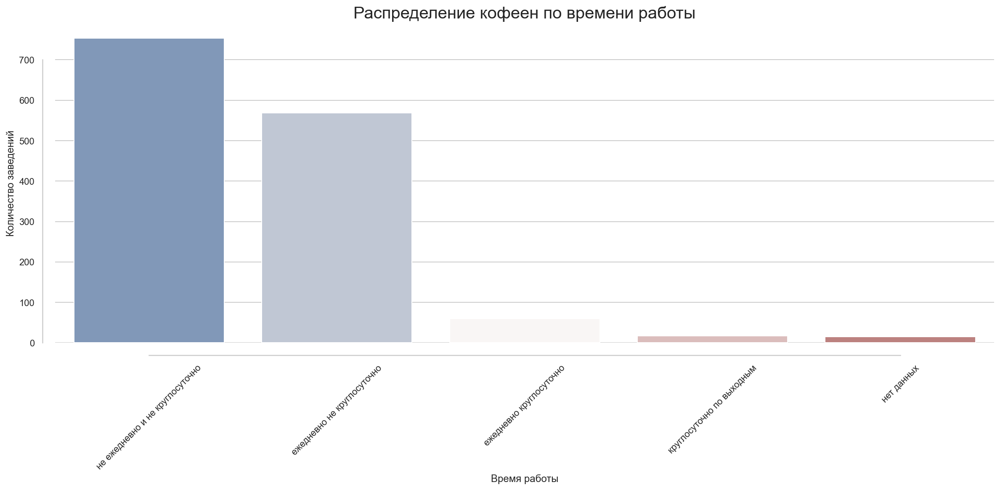

In [46]:
plt.figure(figsize=(20,7))
g = sns.barplot(x=time_cafe['is_24/7'], y=time_cafe['name'], palette="vlag")
plt.title('Распределение кофеен по времени работы', fontsize=20)
plt.xlabel('Время работы')
plt.ylabel('Количество заведений')
sns.despine(offset=15, trim=True)
plt.xticks(rotation=45)
plt.show()

Больше всего кафеен работают не ежедневно и не круглосуточно. На втором месте ежедневно, но не круглосуточно. Круглосуточных кафеен немного.

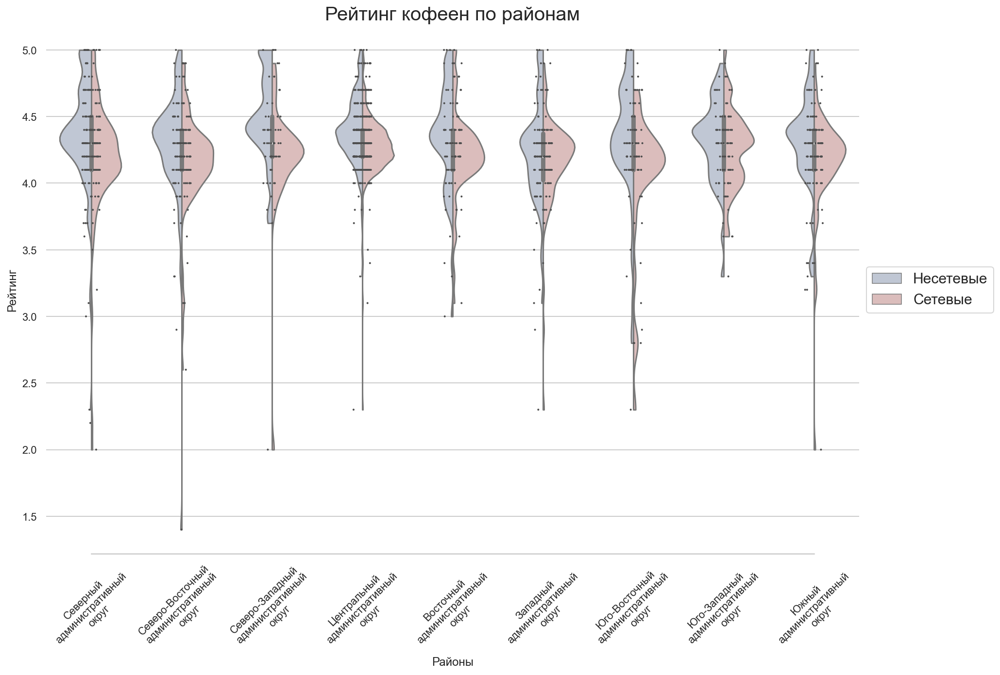

In [47]:
df_cafe['district'] = ['\n'.join(wrap(x, 17)) for x in  df_cafe['district']]
# создаем фигуру, создадим логарифмическую шкалу
f, ax = plt.subplots(figsize=(15, 10))


# стоим "ящики с усами" для выбраных платформ
sns.violinplot(x="district", y="rating", data=df_cafe,  hue="chain", split=True,
            whis=[0, 100], width=.7, palette="vlag", cut=0, bw=0.2)

# добавим точки в "ящик с усами" для наглядности
sns.stripplot(x="district", y="rating", data=df_cafe,
              size=2, color=".3", linewidth=0)


# уберем сетку, уберем надпись "платформы", выровняем ящики
ax.xaxis.grid(False)
ax.set(xlabel="")
ax.set(ylabel="Рейтинг")
sns.despine(trim=True, left=True)
plt.title('Рейтинг кофеен по районам', fontsize=20)
plt.xlabel('Районы')
plt.ylabel('Рейтинг')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)
plt.xticks(rotation=45)
plt.show()

В осномном сетевые кофейни имеют ниже рейтинг по сравнению с несетевыми. В западном округе кафеен с высоким рейтингом не так много, как в других районах.

In [48]:
df_cafe.loc[df['middle_coffee_cup']>1000, 'middle_coffee_cup'] = df.loc[df['middle_coffee_cup']>1000, 'middle_coffee_cup']/10

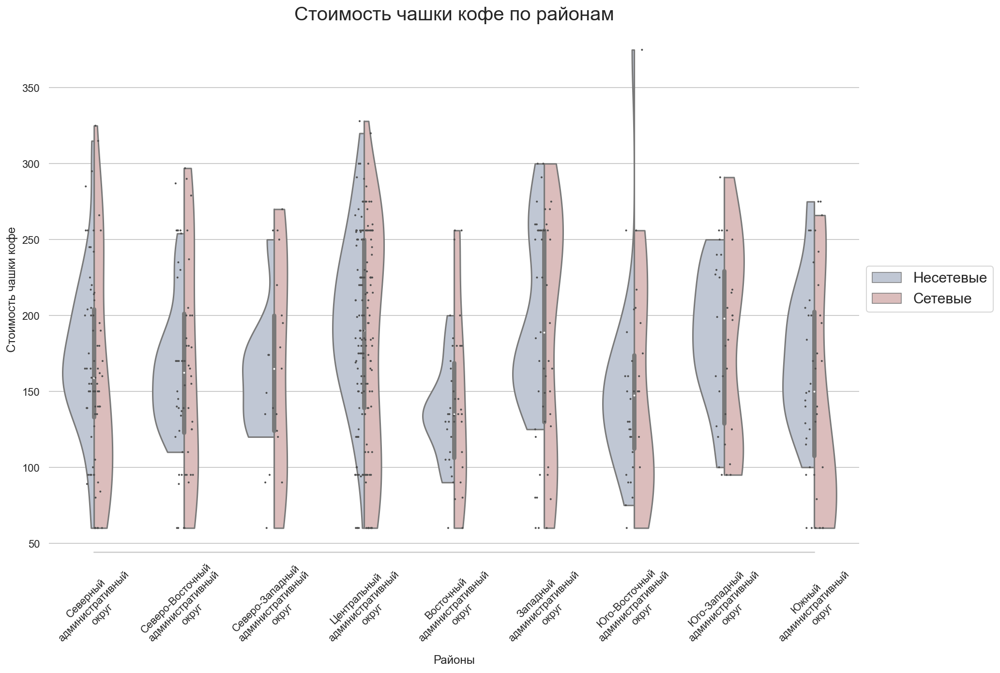

In [49]:
df_cafe['district'] = ['\n'.join(wrap(x, 17)) for x in  df_cafe['district']]
# создаем фигуру, создадим логарифмическую шкалу
f, ax = plt.subplots(figsize=(15, 10))


# стоим "ящики с усами" для выбраных платформ
sns.violinplot(x="district", y="middle_coffee_cup", data=df_cafe,  hue="chain", split=True,
            whis=[0, 100], width=.7, palette="vlag", cut=0, bw=0.5)

# добавим точки в "ящик с усами" для наглядности
sns.stripplot(x="district", y="middle_coffee_cup", data=df_cafe,
              size=2, color=".3", linewidth=0)

ax.xaxis.grid(False)
sns.despine(trim=True, left=True)
plt.title('Стоимость чашки кофе по районам', fontsize=20)
plt.xlabel('Районы')
plt.ylabel('Стоимость чашки кофе')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize=15)
plt.xticks(rotation=45)
plt.show()

Практически во всех районах диапозон стоимости чашки кофе шире в сетевых кофейнях. Кроме того, хорошо видно, что во всех районах можно найти дешевый кофе в сетевых кофейнях. Дешевле кофе в восточном округе, дороже в центральном, западном и юго-западном.

**Проанализировав данные можно сделать выводы:**

- в случае открытия кофейни, придется конкурировать с большим количеством похожих заведений;
- плюс в том, что в данном сегменте сетевых заведений больше и они проигрывают в сервисе, люди ценят крафтовые кофейни;
- лучше открывать кофейню в западном округе, там не так много конкурентов с высоким рейтингом, как в других районах;
- кроме того, в западном округе цена на кружку кофе одна из самых высоких.

Презентация: <https://disk.yandex.kz/i/PmMu9wUbjGzyWg>